In [70]:
from pathlib import Path
import skimage
import numpy as np
import matplotlib.pyplot as plt
import scipy.ndimage as ndi
import pandas as pd
import networkx as nx
import ImageSegmentation.Algorithms as algos
from scipy.interpolate import splprep, splev
import geopandas as gpd
import re
import scipy.sparse as sparse
import NumpySolver as ns
from shapely.geometry import LineString
import pickle
import shapely
import importlib as il
import scipy
from tqdm import tqdm
import NanowireMesh as nwm



# Important instructions
Export every layer from photoshop. Make sure that the number of layers matches the number of files. You may have two layers witwh the same name that overwrote eachother in the saving process. You can watch the folder when the files are being saved to notice which files this is.

## Customize Settings Here

In [71]:
datadir = Path(Path.cwd(), '2023-03-31_AdamAgNW/renamed/3B_01_segmentation_V2')
original_folder = Path(datadir, 'originals')
# use the before image settings

exp_to_sim = pd.read_csv(
    Path(datadir.parents[1], 'exp_to_sim_params.csv')
)
exp_to_sim = exp_to_sim[exp_to_sim.folder == datadir.name]


um_per_pix = exp_to_sim['um_per_pix'].item()
Rc = exp_to_sim['Rc_imputed'].item()
print(
    'um_per_pix: {}\nRc: {}'.format(um_per_pix, Rc)
)

um_per_pix: 0.147058824
Rc: nan


# Defining function to identify missing contacts in graphs

In [72]:
def missing_contacts(g):
	gdf_list = []
	for node in g:
		attrs = dict(key = node)
		attrs.update(
			{k : v for k,v in g.nodes[node].items()}
		)
		gdf_list.append(attrs)
	gdf = pd.DataFrame(gdf_list)
	gdf = gdf.rename(columns = dict(shape = 'geometry'))
	gdf = gpd.GeoDataFrame(gdf)
	isect_idx = gdf.sindex.query(
		gdf.geometry,
		'intersects'
	)
	# h is container for missing edges
	h = nx.Graph()
	for idxs in isect_idx.T:
		row1, row2 = [gdf.loc[idx,:] for idx in idxs]
		# if this edge is reported in g, no further analysis necessary
		edge = (row1.key, row2.key)
		if edge in g.edges:
			continue
		elif row1.key != row2.key: # if this is not a self intersection
			# add to h (graph where all edges are those missing from g)
			h.add_edge(*edge)
		elif not row1.geometry.is_simple:
		# if this is a self intersection, test to see if it's trivial (self == self) or the geometry
		# actually crosses itself
			# if geometry actually crosses itself and isn't reportedin g, add to h
			if (row1.key, row2.key) not in g.edges:
				h.add_edge(row1.key, row2.key)
	
	return h

# Only need to run thesewhenever the wire masks or electrode geometry changes

## Open the before and after images

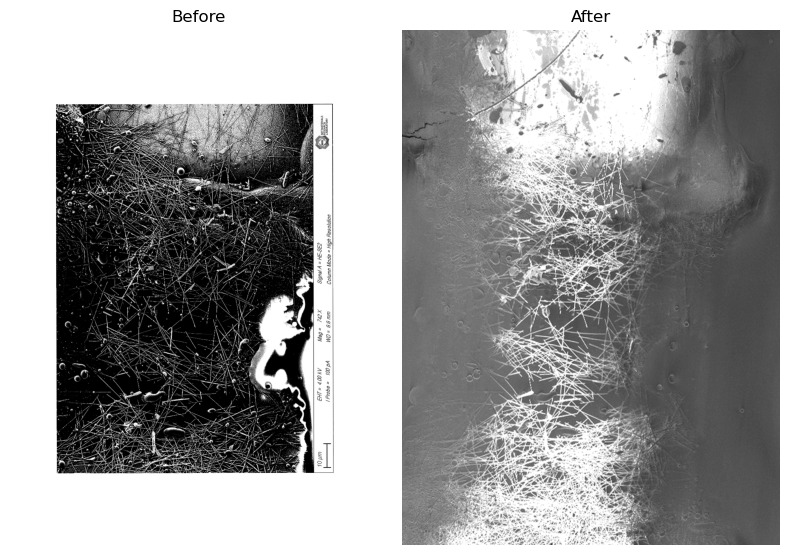

In [73]:
# opening the images except for the actual image

before = skimage.io.imread(Path(original_folder, 'before.png'))
after = skimage.io.imread(Path(original_folder, 'after.png'))


before = np.rot90(before)
after = np.rot90(after)

fig, axs = plt.subplots(
    figsize = (8,14),
    ncols = 2
)
for ax in axs:
    ax.set_axis_off()
ax = axs[0]
ax.set_title('Before')
ax.imshow(before, cmap = 'gray')
ax = axs[1]
ax.set_title('After')
fig.tight_layout()
ax.imshow(after, cmap = 'gray')
fig.tight_layout()
plt.show()

## Extracting binary masks

In [75]:
mask_folder = Path(datadir, 'masks')
Path.mkdir(
    mask_folder,
    exist_ok = True
)

files = list(original_folder.glob('Layer-*.png'))
for f in tqdm(files):
    match = re.match('(Layer-)(\d+)(.png)', f.name)
    if not match:
        continue
    try:
        img = skimage.io.imread(f)
        img = np.rot90(img)
        if img.ndim == 3:
            img = img[:,:,-1]
        mask = np.where(img > 0, 1, 0)
        mask_path = Path(
            mask_folder,
            f.stem + '_mask' + f.suffix
        )
        skimage.io.imsave(mask_path, mask.astype('uint8'), check_contrast = False)

    except Exception as e:
        print('Problem with file {}: {}'.format(f.name, e))
# df = pd.DataFrame(df_list)
# print('Num wires = {}'.format(len(df)))

100%|██████████| 594/594 [00:14<00:00, 41.11it/s]


## Confirming all masks are contiguous

In [77]:
# making alpha and mask layers

mask_files = list(mask_folder.glob('*.png'))
mask_files = sorted(mask_files)
problems = list()
for f in tqdm(mask_files):
    img = skimage.io.imread(f)
    label_img, num_objects = ndi.label(img, structure = np.ones((3,3)))
    if num_objects > 1:
        expanded_labels = skimage.segmentation.expand_labels(label_img, distance = 20)
        problems.append((f, num_objects, expanded_labels))

if problems:
    for (file, num_objects, label_img) in problems:
        print('{} has {} objects'.format(file.name, num_objects))
    fig, axs = plt.subplots(
        figsize = (10, 8 * len(problems)),
        nrows = len(problems)
    )
    if len(problems) == 1:
        axs = [axs]
    for ax, (f, num_objects, img) in zip(axs, problems):
        for n in range(3):
            img = np.rot90(img)
        ax.imshow(img, cmap = 'hot')
        ax.set_title(f.name)
        
else:
    print('All wire masks are contiguous')

100%|██████████| 594/594 [00:04<00:00, 138.95it/s]

All wire masks are contiguous


## Skeletonizing 
we also confirm that all skeletons have exactly two tips

In [78]:
skel_folder = Path(datadir, 'skeletons')
Path.mkdir(
    skel_folder,
    exist_ok = True
)
mask_files = sorted(list(mask_folder.glob('*.png')))
possible_errors = dict()
for f in tqdm(mask_files):
    mask = skimage.io.imread(f)
    bool_skel = skimage.morphology.skeletonize(mask)
    skel = np.where(bool_skel, 1, 0)
    corr = ndi.correlate(skel, weights = [(1,1,1),(1,0,1),(1,1,1)])
    corr *= skel
    skel_path = Path(
        skel_folder,
        f.name.replace('mask','skel')
    )
    skimage.io.imsave(skel_path, skel.astype('uint8'), check_contrast = False)
    if (corr == 1).sum() > 2:
        possible_errors[f.name] = skel


100%|██████████| 594/594 [00:23<00:00, 25.71it/s]


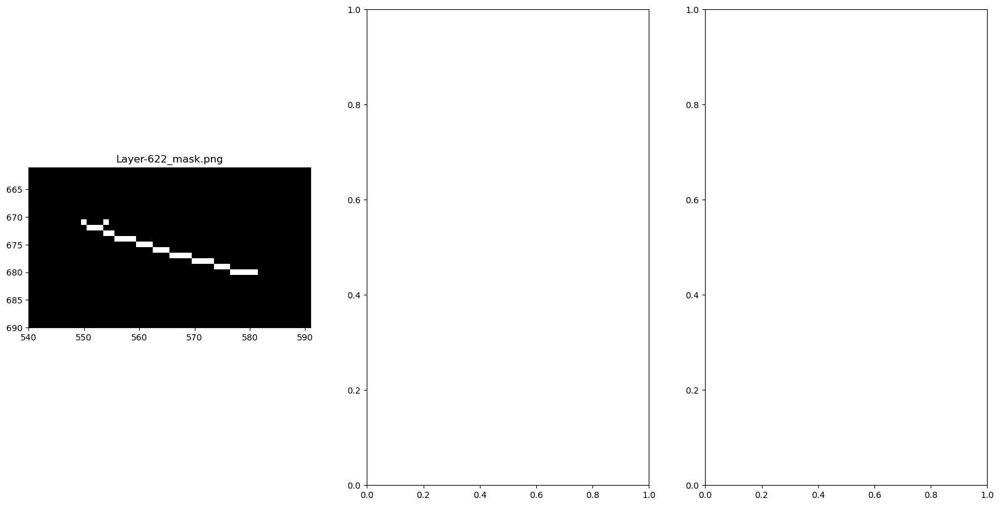

In [79]:

fig, axs = plt.subplots(
    nrows = np.ceil(len(possible_errors)/3).astype(int),
    ncols = 3,
    figsize = (20,10)
)
for (path, img), ax in zip(possible_errors.items(), axs.flatten()):
    ax.set_title(path)
    nz = np.argwhere(img > 0)
    minrow, mincol = nz.min(axis = 0) - 10
    maxrow, maxcol = nz.max(axis = 0) + 10
    ax.set_xlim(mincol, maxcol)
    ax.set_ylim(maxrow, minrow)
    ax.imshow(img, cmap = 'gray')
plt.show()

## Making labeled image

Making Labeled Image: 100%|██████████| 594/594 [00:07<00:00, 80.83it/s] 


595 unique wires loaded


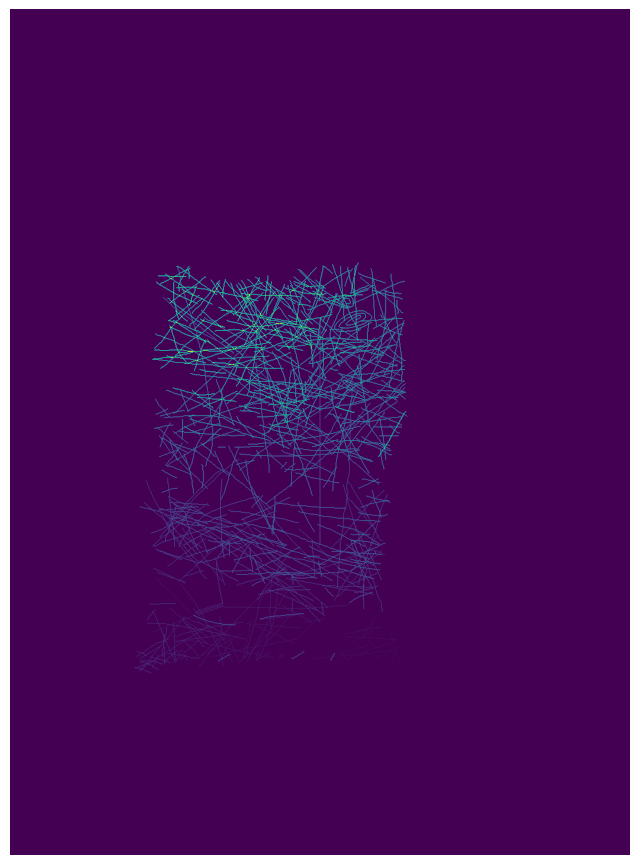

In [81]:
skel_files = list(skel_folder.glob('*.png'))
batch = []
for f in tqdm(skel_files, desc = 'Making Labeled Image'):
    # must read as float otherwise we can't have more than 256 layers
    img = skimage.io.imread(f).astype(int)
    match = re.match('(Layer-)(\d+)(_skel.png)', f.name)
    layer = int(match.group(2))
    img *= layer
    batch.append(img)
    if len(batch) == 100:
        stack = np.stack(batch, axis = -1, dtype = int)
        labeled = stack.max(axis = -1)
        batch = [labeled]
if len(batch) > 1:
    labeled = np.stack(batch, axis = -1, dtype = float).max(axis = -1)
else:
    labeled = batch[0]
print('{} unique wires loaded'.format(len(np.unique(labeled))))

fig, ax = plt.subplots(figsize = (8,16))
ax.imshow(labeled)
ax.set_axis_off()
plt.show()

## Creating Multigraph object from image

In [100]:
import importlib as il
il.reload(algos)
mg = algos.labeled_img_to_graph(labeled, add_electrodes=True, um_per_pix = um_per_pix, num_cores = 8)

import pickle
with open(Path(original_folder, 'multigraph.p'), 'wb') as file:
    pickle.dump(mg, file)

Ordering Segment Pixels:   0%|          | 0/594 [00:00<?, ?it/s]

/Users/adamtrebach/mambaforge/envs/envnw/lib/python3.11/site-packages/skimage/util/dtype.py:541: UserWarning: Downcasting int64 to uint8 without scaling because max value 1 fits in uint8
  return _convert(image, np.uint8, force_copy)
/Users/adamtrebach/mambaforge/envs/envnw/lib/python3.11/site-packages/skimage/util/dtype.py:541: UserWarning: Downcasting int64 to uint8 without scaling because max value 1 fits in uint8
  return _convert(image, np.uint8, force_copy)
/Users/adamtrebach/mambaforge/envs/envnw/lib/python3.11/site-packages/skimage/util/dtype.py:541: UserWarning: Downcasting int64 to uint8 without scaling because max value 1 fits in uint8
  return _convert(image, np.uint8, force_copy)
/Users/adamtrebach/mambaforge/envs/envnw/lib/python3.11/site-packages/skimage/util/dtype.py:541: UserWarning: Downcasting int64 to uint8 without scaling because max value 1 fits in uint8
  return _convert(image, np.uint8, force_copy)
/Users/adamtrebach/mambaforge/envs/envnw/lib/python3.11/site-pac

In [101]:
mh = missing_contacts(mg)
# length of 1 indicates only self crosses are missing
mh.nodes

NodeView(())

## Examining any self crosses

In [102]:
for node in mg:
    shape = mg.nodes[node]['shape']
    if not shape.is_simple:
        print(node)

## Creating electrodes of arbitrary shapes
note that right becomes top electrode and left becomes bottom

In [103]:


for electrode in ['left-electrode.png', 'right-electrode.png']:
    img = skimage.io.imread(Path(original_folder, electrode))
    img = img[:,:,-1]
    img = np.rot90(img)
    bounds = skimage.segmentation.find_boundaries(img)
    idx = np.argwhere(bounds).astype(int)
    xy = idx[:,::-1] * um_per_pix
    poly = shapely.geometry.Polygon()
    for row in tqdm(xy, desc = electrode):
        point = shapely.geometry.Point(row)
        area = point.buffer(2 * um_per_pix)
        poly = poly.union(area)
    if 'left' in electrode:
        bot_poly = poly
    elif 'right' in electrode:
        top_poly = poly

left-electrode.png:   0%|          | 0/3480 [00:00<?, ?it/s]/Users/adamtrebach/mambaforge/envs/envnw/lib/python3.11/site-packages/shapely/set_operations.py:340: RuntimeWarning: invalid value encountered in union
  return lib.union(a, b, **kwargs)
right-electrode.png: 100%|██████████| 4648/4648 [00:14<00:00, 315.63it/s]


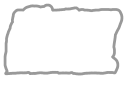

In [104]:
top_poly

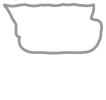

In [105]:
bot_poly

## Calculating intersections with electrodes
note that right = top and left = bottom

In [106]:
with open(Path(original_folder, 'multigraph.p'), 'rb') as file:
	mg = pickle.load(file)


nonpoint_isects = []
	
shapes = [top_poly.exterior, bot_poly.exterior]
elecs = [mg.topElectrode, mg.bottomElectrode]
for electrode,shape in zip(elecs, shapes):
	# remove the existing electrode
	mg.remove_node(electrode)
	# add new node with data
	mg.add_node(
		electrode,
		shape = shape,
		length = shape.length,
		pixel_label = None
	)
	# add new contact resistances
	non_electrodes = set(mg.nodes) - set(elecs)
	for othernode in tqdm(non_electrodes):
		if shape.intersects(mg.nodes[othernode]['shape']):
			isect = shape.intersection(mg.nodes[othernode]['shape'])
			if type(isect) == shapely.Point:
				mg.add_edge(
					electrode,
					othernode,
					shape = isect,
					x = isect.x,
					y = isect.y,
					resistanceType = 'cont',
					resistance = np.nan
				)
			elif type(isect) == shapely.MultiPoint:
				for point in isect.geoms:
					mg.add_edge(
						electrode,
						othernode,
						shape = point,
						x = point.x,
						y = point.y,
						resistanceType = 'cont',
						resistance = np.nan
					)
				# nonpoint_isects.append((isect, electrode, othernode))
				# isect = isect.representative_point()
			else:
				raise TypeError(
					'Contact between {},{} is of type {} but must be Point or MultiPoint'.format(
						electrode, othernode, type(isect)
					)
				)
for el in nonpoint_isects:
	print('{} intersection between nodes {} and {}'.format(*el))

  0%|          | 0/594 [00:00<?, ?it/s]/Users/adamtrebach/mambaforge/envs/envnw/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/adamtrebach/mambaforge/envs/envnw/lib/python3.11/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
100%|██████████| 594/594 [00:00<00:00, 10659.29it/s]


In [107]:
for edge in mg.edges:
    if type(mg.edges[edge]['shape']) != shapely.Point:
        print(edge)

In [108]:
mh = missing_contacts(mg)
len(mh)
# length of 1 means only self intersections are missing

0

# type checking geometries


In [109]:

for node in mg.nodes:
    try:
        assert type(mg.nodes[node]['shape']) == shapely.geometry.LineString
    except AssertionError:
        if node not in [mg.topElectrode, mg.bottomElectrode]:
            print(
                'Node {} has type {}'.format(
                    node,
                    type(mg.nodes[node]['shape'])
                )
            )
for edge in mg.edges:
    shape = mg.edges[edge]['shape']
    try:
        assert type(shape) == shapely.geometry.Point
    except AssertionError:
        print(
            'Edge {} has type {}'.format(
                edge,
                type(shape)
            )
        )


In [110]:
# saving the multigraph one last time
with open(Path(original_folder, 'multigraph.p'), 'wb') as file:
    pickle.dump(mg, file)

## Creating the nanowire mesh object

In [111]:
import NanowireMesh as nwm
il.reload(nwm)
import warnings
from shapely.errors import ShapelyDeprecationWarning
with warnings.catch_warnings():
    warnings.filterwarnings('ignore', category = ShapelyDeprecationWarning)
    g = nwm.NanowireMesh(makeEmpty = False, inGraph = mg, nwDiam = .12, rcMean =11, rcSD = 0)
g.to_pickle(Path(original_folder, 'nanowiremesh.p'))

Adding internal resistance


100%|██████████| 849/849 [00:01<00:00, 436.21it/s]


Finding percolating cluster.
Percolating cluster found.
Checking that all node names are integers.
Runtime: 2.76


In [112]:
h = missing_contacts(g)
len(h)

0

# Display large plot of nanowire mesh for visual inspection

In [115]:
gdf = g.gdf()

/Users/adamtrebach/mambaforge/envs/envnw/lib/python3.11/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/adamtrebach/mambaforge/envs/envnw/lib/python3.11/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(


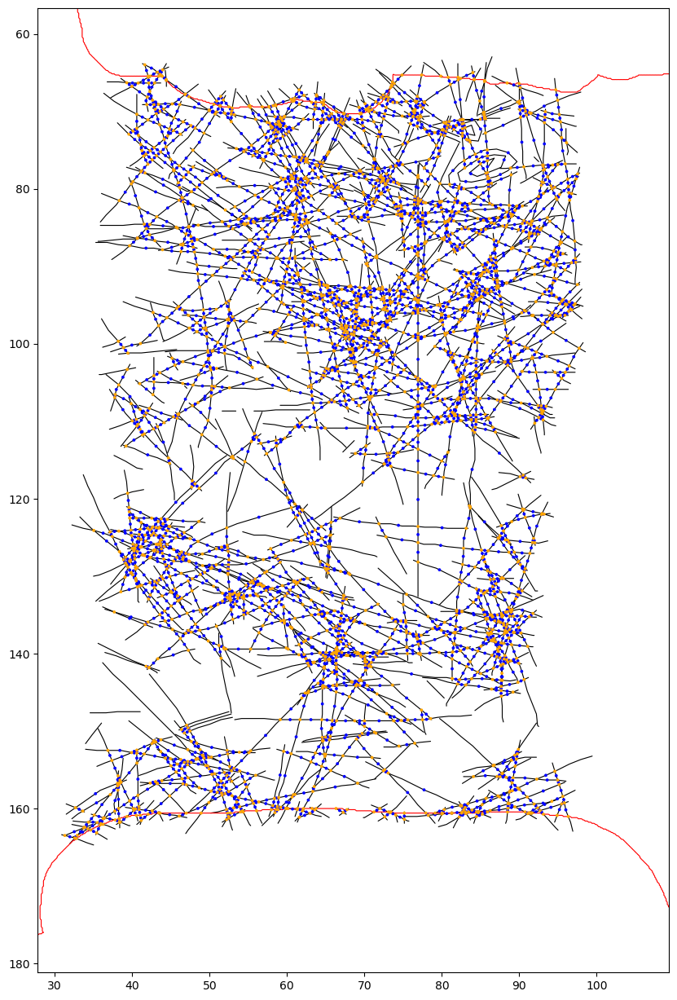

In [116]:
bounds = gdf[gdf.el_type == 'wire'].bounds
minx, miny = 0.9 * bounds[['minx','miny']].min()
maxx, maxy = 1.1 * bounds[['maxx','maxy']].max()
fig, ax = plt.subplots(
    figsize = (10,20)
)
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)
ax.invert_yaxis()
wdf = gdf[gdf.el_type == 'wire']
edf = gdf[gdf.el_type == 'electrode']
idf = gdf[gdf.el_type == 'int']
cdf = gdf[gdf.el_type == 'cont']

wdf.buffer(wdf.diam/2).plot(
    ax = ax,
    color = 'black'
)
edf.buffer(edf.diam/2).plot(
    ax = ax,
    color = 'red'
)
idf.buffer(0.2).plot(
    ax = ax,
    color = 'blue'
)
cdf.buffer(0.2).plot(
    ax = ax,
    color = 'orange'
)
plt.show()

## Solve for effective contact resistance
make sure to put in the correct total network resistance
pray that it is positive

In [118]:
g = nwm.NanowireMesh(makeEmpty = False, inPickle = Path(original_folder, 'nanowiremesh.p'))

h = missing_contacts(g)
len(h)

Checking that all node names are integers.
Runtime: 0.23


0

In [119]:

import EffectiveContactResistance as ecr
import importlib as il
il.reload(nwm)

il.reload(ecr)
Rc_imputed = ecr.impute(
	g,
	Rt = exp_to_sim.Rs.item(),
	solver = 'numpy'
)
for e in g.edges:
	if g.edges[e]['resistanceType'] == 'cont':
		g.edges[e]['resistance'] = Rc_imputed

ns.solve(
	g,
	voltage = 1,
	inplace = True
)

2nd Pass: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]


0

In [123]:
Rc_imputed

24.309256014923122

In [124]:
for e in g.edges:
    if g.edges[e]['resistanceType'] == 'cont':
        print(g.edges[e]['resistance'])
        break

24.309256014923122


In [122]:
g.sheetResistance

26.747651726087184

In [125]:
g.to_pickle(Path(mask_folder, 'nanowiremesh.p'))

## Calculate Centralities

In [12]:
bc = nx.betweenness_centrality(g, weight = 'resistance')

ebc = nx.edge_betweenness_centrality(g, weight = 'resistance')

for node in bc.keys():
    g.nodes[node]['bc'] = bc[node]
for edge in ebc.keys():
    g.edges[edge]['bc'] = ebc[edge]
g.to_pickle(Path(mask_folder, 'nanowiremesh.p'))

# Finding failures

## Load nanowire mesh

In [13]:
g = nwm.NanowireMesh(makeEmpty = False, inPickle = Path(mask_folder, 'nanowiremesh.p'))

Checking that all node names are integers.
Runtime: 0.54


## Load gdf of nanowire mesh data

In [14]:
node_df_list = []
for node in g:
    data = g.nodes[node]
    node_df_list.append(
        dict(
            key = node,
            geometry = data['shape'],
            el_type = 'wire' if node not in [g.topElectrode, g.bottomElectrode] else 'electrode',
            bc = data['bc'],
            current = None
        )
    )
edge_df_list = []
for edge in g.edges:
    data = g.edges[edge]
    edge_df_list.append(
        dict(
            key = edge,
            geometry = data['shape'],
            el_type = data['resistanceType'],
            bc = data['bc'],
            current = data['current'] if 'current' in data.keys() else 0
        )
    )
tempdf = pd.DataFrame(node_df_list + edge_df_list)
gdf = gpd.GeoDataFrame(tempdf)

## filter out portions of the network that are not in the before image
we do this a little inexactly but it should be good enough

In [15]:
# testable_region = skimage.io.imread(Path(mask_folder, 'testable-region.png'))
# testable_region = testable_region[:,:,-1]
# testable_region = np.rot90(testable_region)
# testable_region_boundary = skimage.segmentation.find_boundaries(
#     label_img = testable_region > 0,
#     connectivity = 2
# )
# idx = np.argwhere(testable_region_boundary)
# xy = idx[:,::-1] * um_per_pix
# boundary = shapely.geometry.MultiPoint(xy).buffer(2).buffer(-2).exterior
# testable_poly = shapely.geometry.Polygon(boundary)
# gdf = gdf[gdf.intersects(testable_poly)].reset_index(drop = True)

## Create MultiPolygon failure geometries
then save the failed flag to the nanowiremesh.p file

In [16]:
failures = dict()
files = [Path(mask_folder, 'failures-wires.png'), Path(mask_folder, 'failures-junctions.png')]
for f in files:
    print(f)
    img = skimage.io.imread(f)
    img = img[:,:,-1] # only keep alpha channel
    img = np.rot90(img)
    img = np.where(img > 0, 1, 0)
    img_labeled, num_objects = ndi.label(img, structure = np.ones((3,3)))
    multipoly_list = []
    for label in np.unique(img_labeled):
        if label == 0:
            continue
        idx = np.argwhere(img_labeled == label)
        xy = idx[:, ::-1] * um_per_pix
        multipoint = shapely.geometry.MultiPoint(xy)
        multipoly_list.append(multipoint.buffer(0.5 * um_per_pix).convex_hull)
    multipoly = shapely.geometry.MultiPolygon(multipoly_list)
    failures[f.stem] = multipoly
gdf.loc[gdf.el_type == 'electrode', 'failed'] = False
gdf.loc[gdf.el_type.isin(['int', 'wire']), 'failed'] = gdf.loc[gdf.el_type.isin(['int', 'wire']), 'geometry'].intersects(failures['failures-wires'])
gdf.loc[gdf.el_type == 'cont', 'failed'] = gdf.loc[gdf.el_type == 'cont', 'geometry'].intersects(failures['failures-junctions'])

for idx, row in gdf.iterrows():
    if row.el_type in ['electrode', 'wire']:
        g.nodes[row.key]['failed'] = row.failed
    elif row.el_type in ['int', 'cont']:
        g.edges[row.key]['failed'] = row.failed
g.to_pickle(Path(mask_folder, 'nanowiremesh.p'))
gdf

/Users/adamtrebach/Documents/Research/TPV/Nanowires/2023-03-31_AdamAgNW/renamed/3B_01_segmentation/failures-wires.png
/Users/adamtrebach/Documents/Research/TPV/Nanowires/2023-03-31_AdamAgNW/renamed/3B_01_segmentation/failures-junctions.png


,key,geometry,el_type,bc,current,failed
0,0,"LINEARRING (15.278 205.638, 15.255 205.655, 15...",electrode,0.118597,NaN,False
1,5434,"LINEARRING (70.669 69.892, 70.686 69.869, 70.6...",electrode,0.088276,NaN,False
2,10,"LINESTRING (84.945 160.632, 85.462 160.834, 86...",wire,0.000007,NaN,False
3,1,"LINESTRING (69.939 153.918, 70.714 154.274, 71...",wire,0.000010,NaN,False
4,3,"LINESTRING (77.599 157.516, 77.882 157.646, 78...",wire,0.000747,NaN,False
...,...,...,...,...,...,...
12989,"(5428, 5429)",POINT (59.741 89.331),int,0.002457,0.000297,False
12990,"(5429, 5430)",POINT (57.697 89.997),int,0.001432,0.000491,False
12991,"(5430, 5431)",POINT (56.802 91.579),int,0.001260,0.000515,False
12992,"(5431, 5432)",POINT (56.770 91.753),int,0.001060,0.000352,False


## Adding the failure geometries into the gdf

In [17]:
failure_gdf_list = []
for key, geometry in failures.items():
    row = dict(
        key = key,
        el_type = key,
        geometry = geometry
    )
    failure_gdf_list.append(row)
failure_gdf = gpd.GeoDataFrame(
    pd.DataFrame(
        failure_gdf_list
    )
)
gdf = gdf.append(failure_gdf)


/var/folders/qz/xrfprrw92pgbn57_f623j2ph0000gn/T/ipykernel_87562/370560461.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf = gdf.append(failure_gdf)


## Plotting to verify that our our failures are faithfully represented

In [18]:

# fig, ax = plt.subplots(figsize = (12,16))
# ['wire', 'int', 'cont' , 'failures-wires','failures-junctions']

# # making plot vesions of gdfs
# # wires
# pgdf = gdf[gdf.el_type == 'wire'].reset_index(drop = True)
# pgdf['geometry'] = pgdf.buffer(0.12)
# pgdf.plot(ax = ax, color = 'black')

# # resistors
# pgdf = gdf[gdf.el_type.isin(['int','cont'])].reset_index(drop = True)
# pgdf['geometry'] = pgdf.buffer(0.1)
# pgdf.plot(ax = ax, color = 'red')

# plt.show()

color_dict = {
   'electrode' : 'black',
   'wire' : 'black',
   'int' : 'red',
   'cont' : 'red',
   'failures-junctions' : 'green',
    'failures-wires' : 'blue'
}
gdf['color'] = gdf.el_type.apply(lambda x : color_dict[x])
gdf.explore(
    color = gdf.color
)
    

In [72]:
gdf.el_type.unique()

array(['electrode', 'wire', 'cont', 'int', 'failures-wires',
       'failures-junctions'], dtype=object)

## Hypothesis testing
What is the probability that, if failures are drawn at random from the BC distribution, the given number of failures would come have bc greater than ```bc_quantile``` of the rest of the BC distribution?

In [42]:
from scipy.special import comb
sdf_list = []
bc_quantile = 0.5
for el_type in gdf.el_type.unique():
    df = gdf[gdf.el_type == el_type].reset_index(drop = True)
    bcval = df.bc.quantile(bc_quantile)
    failures = df[df.failed].reset_index(drop = True)
    n = (failures.bc >= bcval).sum() # number of failures with bc > bound
    N = len(failures) # total observations
    p = 1 - bc_quantile
    q = bc_quantile
    P = comb(N,n) * p**n * q**(N-n)
    print('{} prob = {:.3f}'.format(el_type, P))
    

electrode prob = 1.000
wire prob = 0.052
cont prob = 0.500
cont prob = 0.500
int prob = 0.176
int prob = 0.176

## T-test

In [20]:
for el_type in gdf.el_type.unique():
    if el_type == 'electrode':
        continue
    df = gdf[gdf.el_type == el_type].reset_index(drop = True)
    t, p = scipy.stats.ttest_ind(
        df[df.failed].bc,
        df[df.failed == False].bc
    )
    print(el_type)
    print(
        't statistic: {:.5f}\tp value: {:.5f}\n'.format(
            t,p
        )
    )

wire
t statistic: 6.36905	p value: 0.00000


t statistic: 6.36905	p value: 0.00000

cont
t statistic: -0.06195	p value: 0.95061

cont
t statistic: -0.06195	p value: 0.95061

int
t statistic: 6.02103	p value: 0.00000



## Hypothesis Testing with Logistic Regression
read more here https://www.appstate.edu/~whiteheadjc/service/logit/intro.htm

In [21]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from scipy.stats import percentileofscore
from scipy import integrate
ldf_list = [] #logit dataframe
for el_type in gdf.el_type.unique():
    if el_type == 'electrode':
        continue
    print('Circuit Element type: {}'.format(el_type))
    df = gdf[gdf.el_type == el_type].reset_index()
    X = df['pctile'] = percentileofscore(df.bc, df.bc).reshape(-1,1) 
    y = np.where(df.failed, 1, 0)
    model = LogisticRegression(random_state = 420,penalty = None)

    clf = model.fit(X,y)
    
    print('Coefficient = {:.5f}'.format(clf.coef_.item()))
    print('Intercept = {:.5f}'.format(clf.intercept_.item()))
    def pdf(x, a, B):
        return 1/(1 + np.exp(-a + -B * x))
    
    # constrained model log likelihood
    f = df.failed.sum() / len(df)
    a = -np.log(1/f - 1)
    B = 0
    LLa = np.log(pdf(x = X, a = a, B = B)).sum()   
    
    # unconstrained model log likelihood
    a = clf.intercept_.item()
    B = clf.coef_.item()
    LLaB = np.log(pdf(x = X, a = a, B = B)).sum()
    print('Model chi-square = {:.2f}'.format(-2 * (LLa - LLaB)))
    print('big chi square is good, small is bad')
    
    # observed_failure_frequency = df.failed.sum() / len(df)
    # expected_failure_frequency = integrate.quad(pdf, 0, 1)[0]
    # print(
    #     'Chi square:',
    #     scipy.stats.chisquare(
    #         [observed_failure_frequency, 1 - observed_failure_frequency],
    #         [expected_failure_frequency, 1 - expected_failure_frequency]
    #     )
    # )
    # print(confusion_matrix(y, clf.predict(X)))
    print()
    ldf_list.append(
        dict(el_type = el_type, coef = clf.coef_.item(), intercept = clf.intercept_.item())
    )
ldf = pd.DataFrame(ldf_list)
ldf
    


Circuit Element type: wire
Coefficient = 0.02363
Intercept = -6.91905
Model chi-square = -5409.28
big chi square is good, small is bad

Circuit Element type: cont
Coefficient = 0.01455
Intercept = -7.15472
Model chi-square = -1079.74
big chi square is good, small is bad

Circuit Element type: int
Coefficient = 0.03193
Intercept = -8.07788
Model chi-square = -8664.19
big chi square is good, small is bad



,el_type,coef,intercept
0,wire,0.023634,-6.919054
1,cont,0.014551,-7.154716
2,int,0.031932,-8.077880


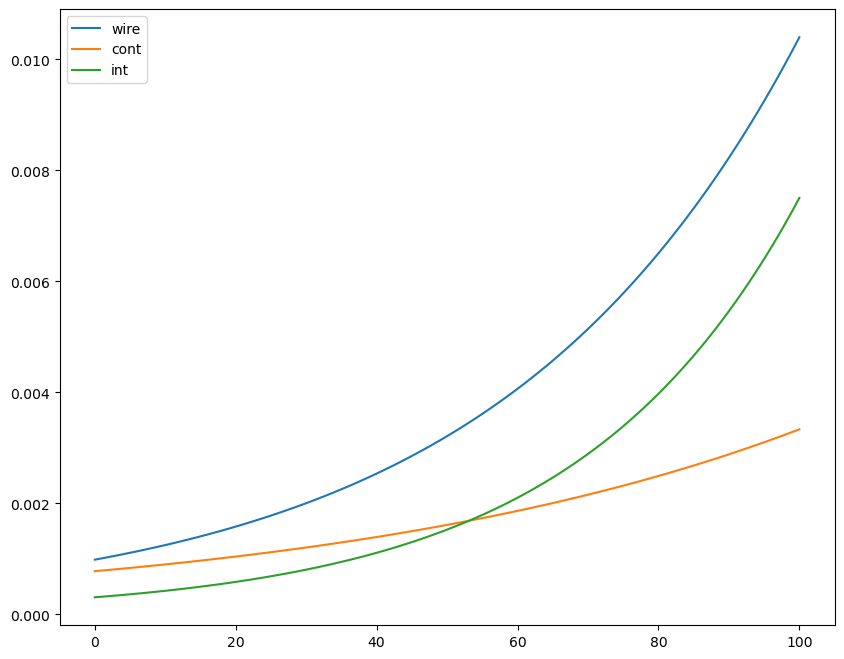

In [22]:
fig, ax = plt.subplots(figsize = (10,8))

for idx,row in ldf.iterrows():
    x = np.linspace(0,100,101)
    y = 1/ (1 + np.exp(-row.coef * x + -row.intercept))
    ax.plot(x,y,label = row.el_type)
plt.legend()
plt.show()

In [23]:
gdf.groupby(['el_type', 'failed'])['bc'].aggregate(['mean','sem', 'count'])

mean       sem  count
el_type   failed                           
cont      False   0.000865  0.000062   6239
          True    0.000774  0.000377     11
electrode False   0.267806  0.113833      2
int       False   0.004812  0.000143  11026
          True    0.023002  0.006715     25
wire      False   0.004646  0.000134  12186
          True    0.018217  0.004254     49

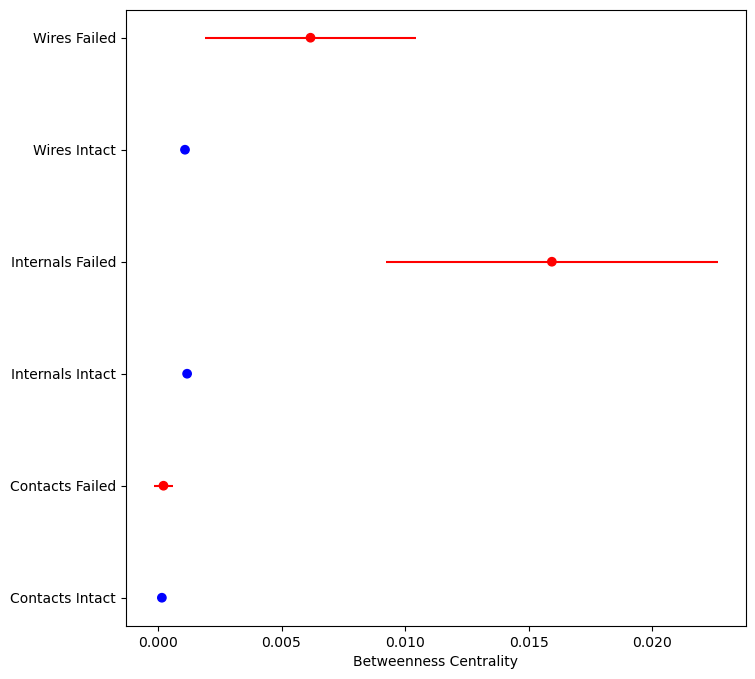

In [24]:
sdf = gdf[gdf.el_type != 'electrode'].drop(columns = 'geometry').groupby(
    by = ['el_type', 'failed']
).aggregate(
    ['median', 'sem']
).reset_index()
sdf['title'] = sdf.apply(
    lambda x : dict(cont = 'Contacts', int = 'Internals', wire = 'Wires')[x.el_type.item()] + (' Failed' if x.failed.item() else ' Intact'),
    axis = 1
)
fig, ax = plt.subplots(figsize = (8,8))
ax.scatter(
    sdf.bc['median'],
    sdf.title,
    color = ['red' if 'Failed' in title else 'blue' for title in sdf.title]
)
for failed in [True, False]:
    ssdf = sdf[sdf.failed == failed]
    ax.errorbar(
        ssdf.bc['median'],
        ssdf.title,
        xerr = ssdf.bc['sem'],
        fmt = 'none',
        color = 'red' if failed else 'blue'
    )
ax.set_xlabel('Betweenness Centrality')
plt.show()

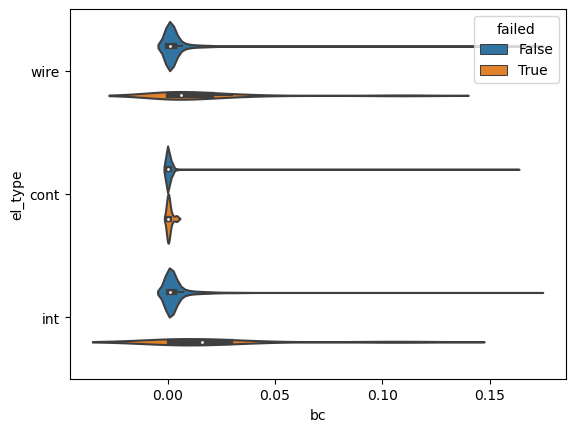

In [25]:
import seaborn as sns
sns.violinplot(
    data = gdf[gdf.el_type != 'electrode'],
    y = 'el_type',
    x = 'bc',
    hue = 'failed'
)
plt.show()